In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import folium
from folium.plugins import MarkerCluster # for world map

from sorted_months_weekdays import *
from sort_dataframeby_monthorweek import * #for sorting based on month

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('/Users/yash/Downloads/covid_impact_on_airport_traffic.csv')
df.head()

,AggregationMethod,Date,Version,AirportName,PercentOfBaseline,Centroid,City,State,ISO_3166_2,Country,Geography
0,Daily,2020-04-03,1.0,Kingsford Smith,64,POINT(151.180087713813 -33.9459774986125),Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1..."
1,Daily,2020-04-13,1.0,Kingsford Smith,29,POINT(151.180087713813 -33.9459774986125),Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1..."
2,Daily,2020-07-10,1.0,Kingsford Smith,54,POINT(151.180087713813 -33.9459774986125),Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1..."
3,Daily,2020-09-02,1.0,Kingsford Smith,18,POINT(151.180087713813 -33.9459774986125),Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1..."
4,Daily,2020-10-31,1.0,Kingsford Smith,22,POINT(151.180087713813 -33.9459774986125),Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1..."


In [3]:
# Adding a column to corresponding weekday
df['Day'] = pd.to_datetime(df['Date']).dt.day_name()

In [4]:
# Adding a column to corresponding month
df['Month'] = pd.to_datetime(df['Date']).dt.month_name()

In [5]:
df['long'] = df['Centroid'].apply(lambda x: x[6:-1].split(' ')[0])
df['lat'] = df['Centroid'].apply(lambda x: x[6:-1].split(' ')[1])

In [6]:
#dropping unwanted columns
df.drop(columns=['AggregationMethod','Version','Centroid'], inplace=True )

In [7]:
df.head()

,Date,AirportName,PercentOfBaseline,City,State,ISO_3166_2,Country,Geography,Day,Month,long,lat
0,2020-04-03,Kingsford Smith,64,Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1...",Friday,April,151.180087713813,-33.9459774986125
1,2020-04-13,Kingsford Smith,29,Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1...",Monday,April,151.180087713813,-33.9459774986125
2,2020-07-10,Kingsford Smith,54,Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1...",Friday,July,151.180087713813,-33.9459774986125
3,2020-09-02,Kingsford Smith,18,Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1...",Wednesday,September,151.180087713813,-33.9459774986125
4,2020-10-31,Kingsford Smith,22,Sydney,New South Wales,AU,Australia,"POLYGON((151.164354085922 -33.9301772341877, 1...",Saturday,October,151.180087713813,-33.9459774986125


In [8]:
df.shape

(7247, 12)

In [9]:
df.isna().sum()

Date                 0
AirportName          0
PercentOfBaseline    0
City                 0
State                0
ISO_3166_2           0
Country              0
Geography            0
Day                  0
Month                0
long                 0
lat                  0
dtype: int64

In [10]:
df.describe()

,PercentOfBaseline
count,7247.000000
mean,66.651442
std,22.134433
min,0.000000
25%,53.000000
50%,67.000000
75%,84.000000
max,100.000000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7247 entries, 0 to 7246
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Date               7247 non-null   object
 1   AirportName        7247 non-null   object
 2   PercentOfBaseline  7247 non-null   int64 
 3   City               7247 non-null   object
 4   State              7247 non-null   object
 5   ISO_3166_2         7247 non-null   object
 6   Country            7247 non-null   object
 7   Geography          7247 non-null   object
 8   Day                7247 non-null   object
 9   Month              7247 non-null   object
 10  long               7247 non-null   object
 11  lat                7247 non-null   object
dtypes: int64(1), object(11)
memory usage: 679.5+ KB


In [12]:
# changing name of United States of America (the) to United States of America
df['Country'] = df['Country'].str.replace(" (the)", "", regex=False).astype(object)

In [13]:
#Encode the input Variables
def Encode(df):
    for column in df.columns[~df.columns.isin(['PercentOfBaseline','Date'])]:
        df[column] = df[column].factorize()[0] # or df['product_name'], mapping = df['product_name'].factorize(), that's why [0] is used because im only taking the labels throwing away the uniques that map back to i/p

    return df

df_en = Encode(df.copy())
df_en.head()

,Date,AirportName,PercentOfBaseline,City,State,ISO_3166_2,Country,Geography,Day,Month,long,lat
0,2020-04-03,0,64,0,0,0,0,0,0,0,0,0
1,2020-04-13,0,29,0,0,0,0,0,1,0,0,0
2,2020-07-10,0,54,0,0,0,0,0,0,1,0,0
3,2020-09-02,0,18,0,0,0,0,0,2,2,0,0
4,2020-10-31,0,22,0,0,0,0,0,3,3,0,0


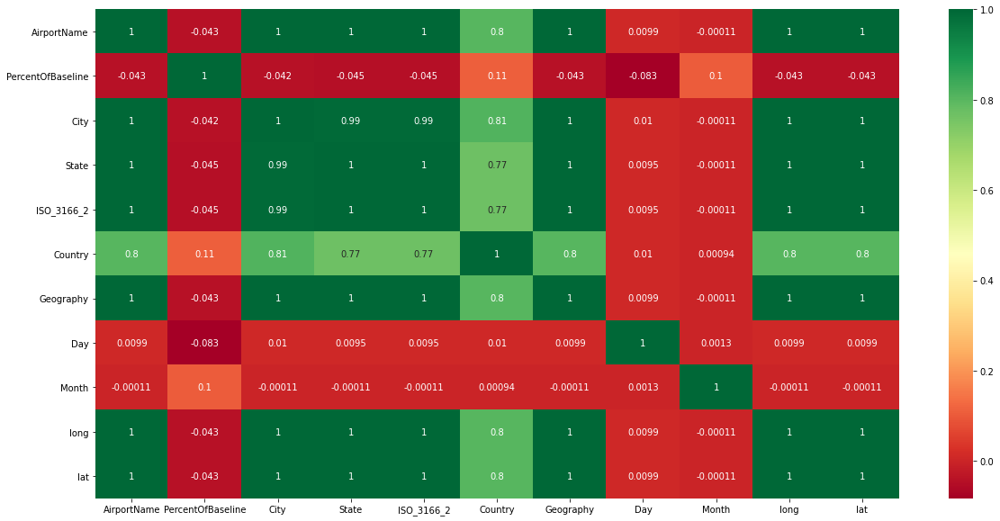

In [14]:
#correlation between variables
corrmat = df_en.corr()
top_corr_features=corrmat.index
plt.figure(figsize=(20,10))
g = sns.heatmap(df_en.corr(), annot=True,cmap='RdYlGn')

# Exploratory Data Analysis

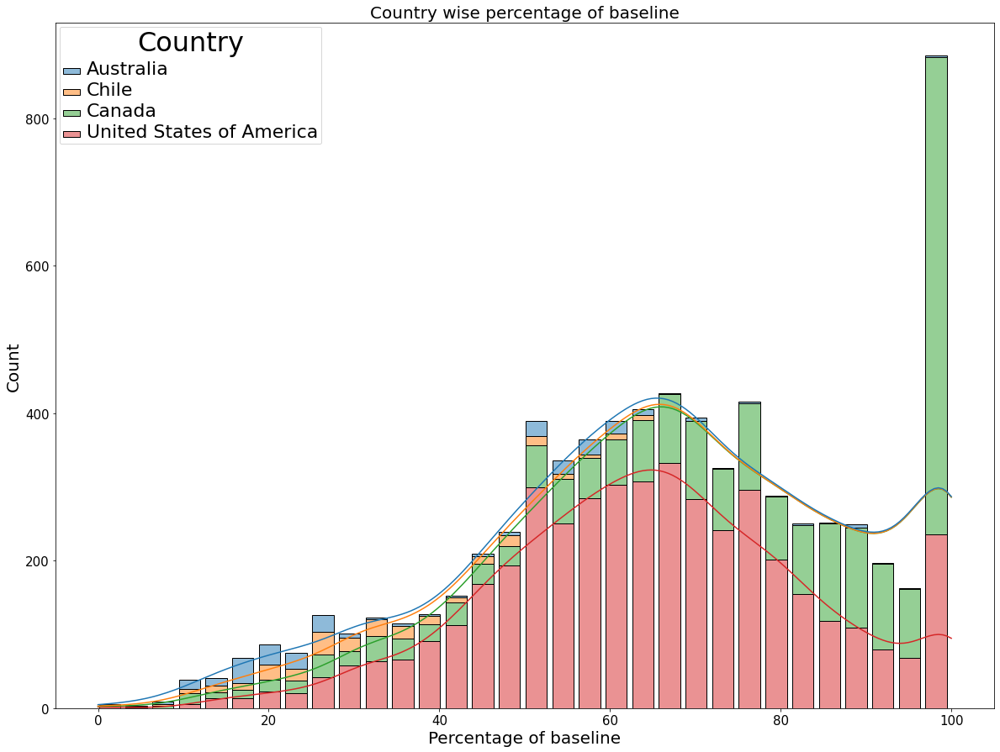

In [15]:
fig = plt.figure(figsize=(20,15))

ax = sns.histplot(data=df, x = 'PercentOfBaseline',kde=True,hue='Country', multiple='stack', shrink = .8)

plt.setp(ax.get_legend().get_texts(), fontsize='22') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='32') # for legend title

plt.ylabel("Count",size=20)
plt.xlabel("Percentage of baseline",size=20)
plt.title('Country wise percentage of baseline', size = 20)
plt.tick_params(labelsize=15)
plt.show()

### Country with airports count

In [16]:
country_name = ['Australia', 'Chile', 'Canada', 'United States of America']
count_list = []
for i in country_name:
    airport_count = len(df.AirportName[df['Country']==i].value_counts())
    count_list.append(airport_count)
count_list

[1, 1, 9, 17]

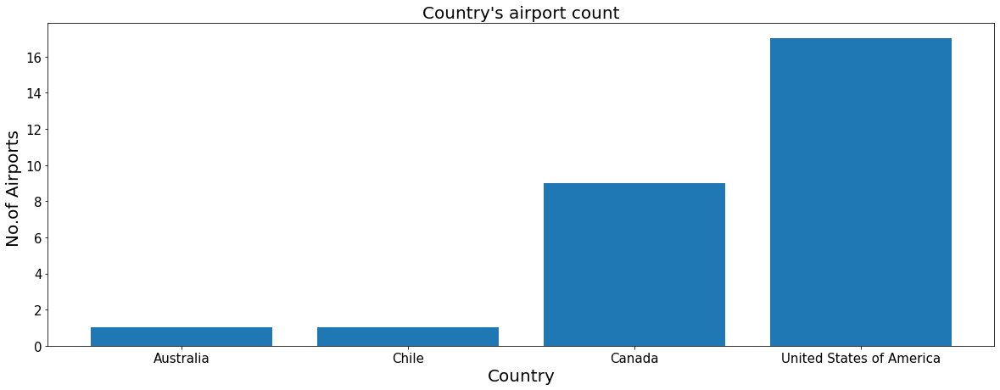

In [17]:
fig = plt.figure(figsize=(20,7))
plt.bar(country_name, count_list)
plt.ylabel("No.of Airports ",size=20)
plt.xlabel("Country",size=20)
plt.title("Country's airport count", size = 20)
plt.tick_params(labelsize=15)
plt.show()

### Country wise dataset distribution

In [18]:
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}%'.format(p=pct)
    return my_autopct

In [19]:
df['Country'].value_counts()

United States of America    4441
Canada                      2311
Australia                    257
Chile                        238
Name: Country, dtype: int64

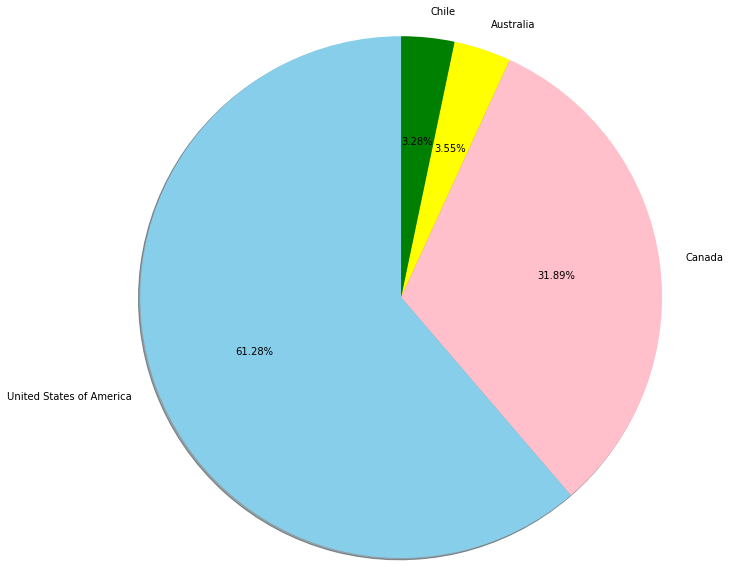

In [20]:
labels = df['Country'].value_counts().keys()
values = df['Country'].value_counts().values
fig1, ax1 = plt.subplots()
colors = ['skyblue','pink', 'yellow', 'green']
ax1.pie(values, labels=labels, autopct=make_autopct(values),shadow=True,
        startangle=90,colors=colors, radius=3)
plt.show()

In [21]:
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)

In [22]:
for i in range(len(df)):
    lat = df.iloc[i]['lat']
    long = df.iloc[i]['long']
    radius=5
    folium.CircleMarker(location = [lat, long], radius=radius,fill =True).add_to(marker_cluster)
    
world_map

### PercentOfBaseline of each airport

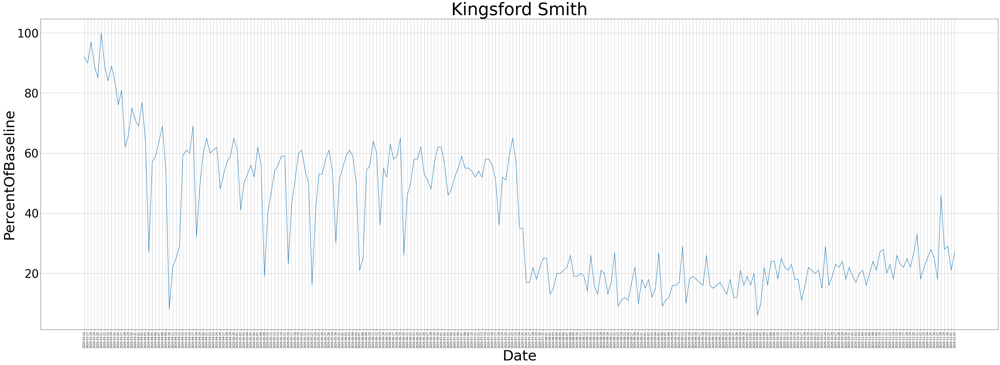

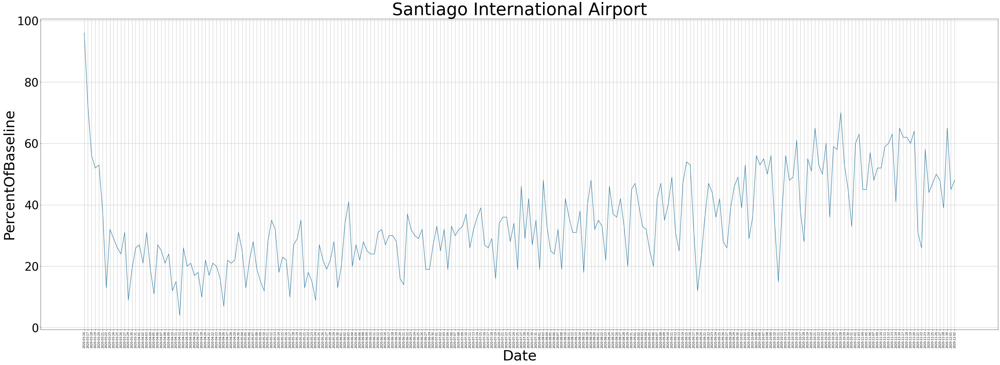

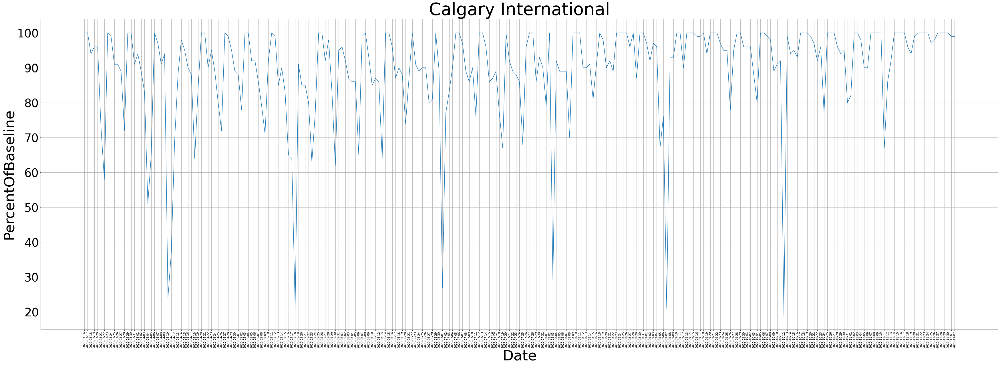

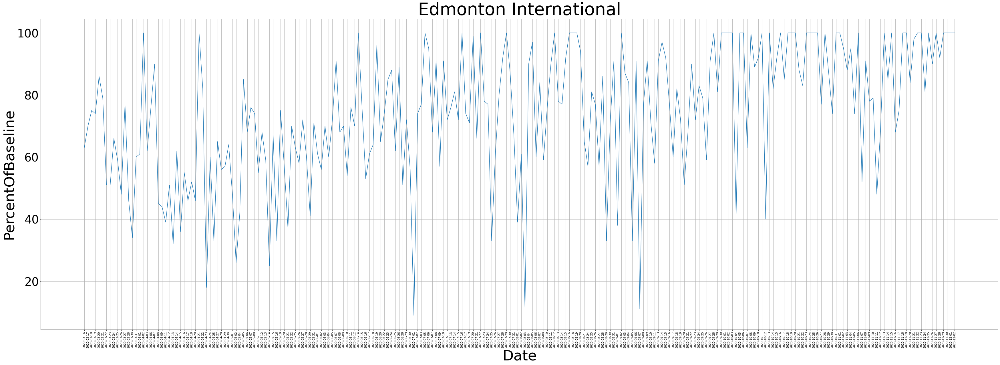

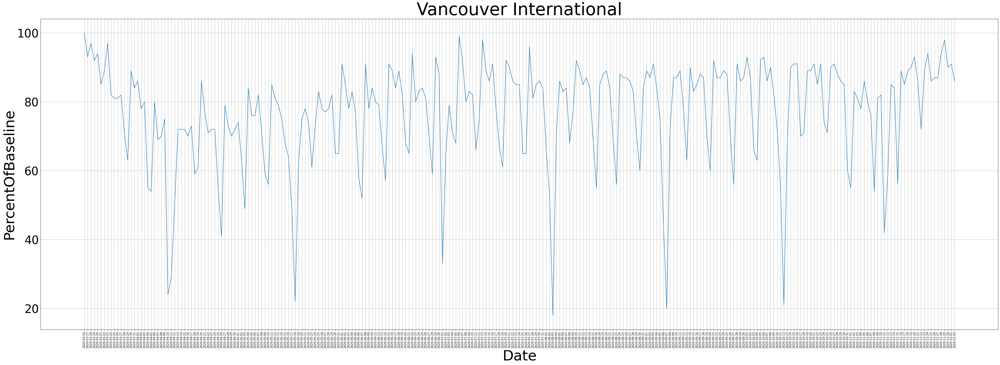

...

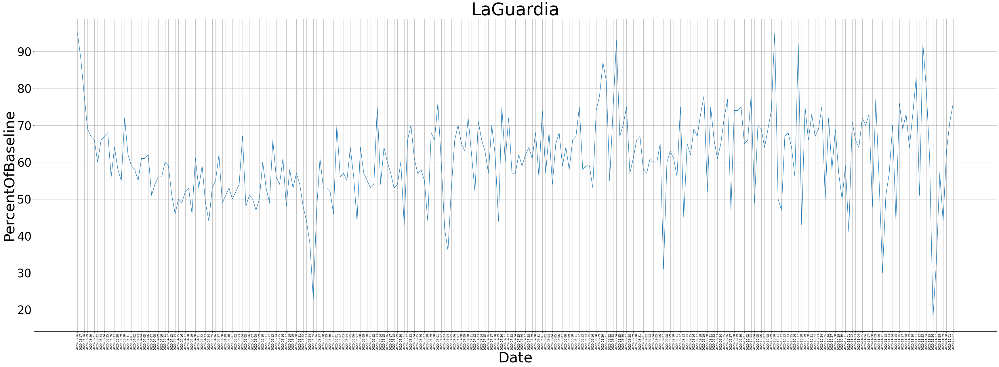

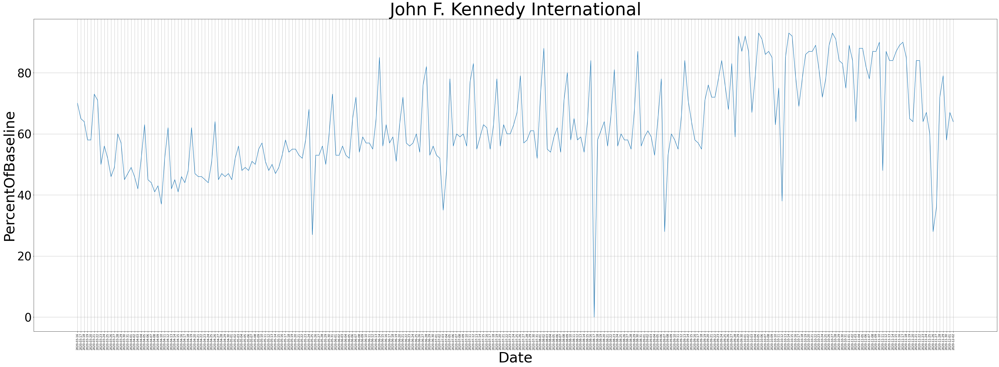

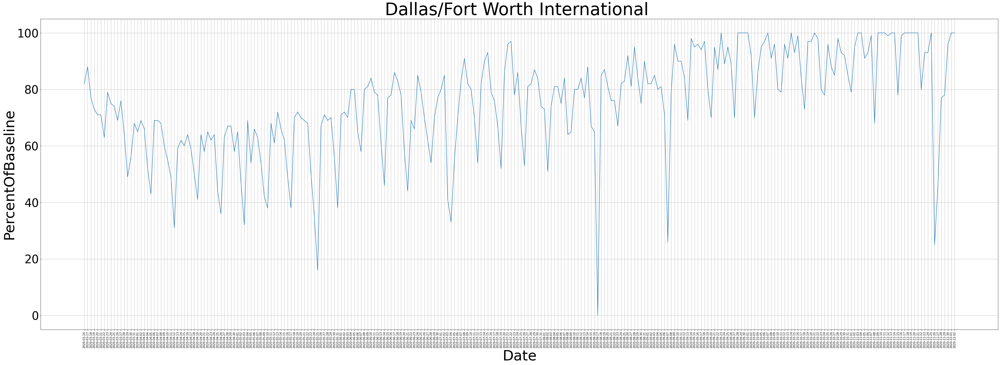

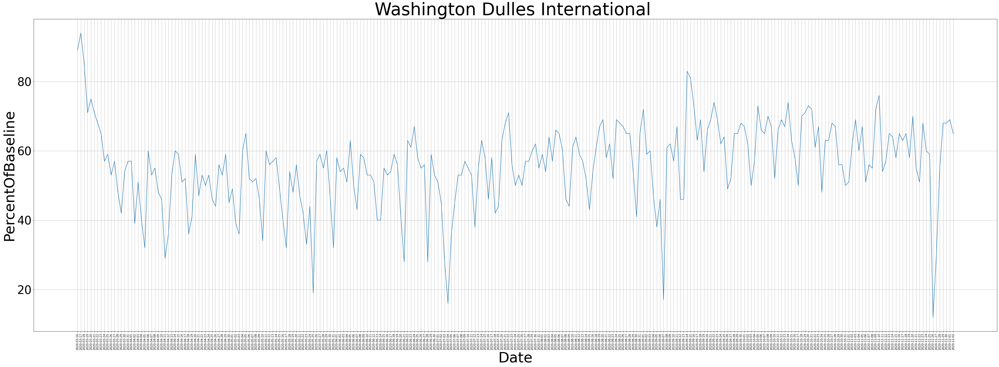

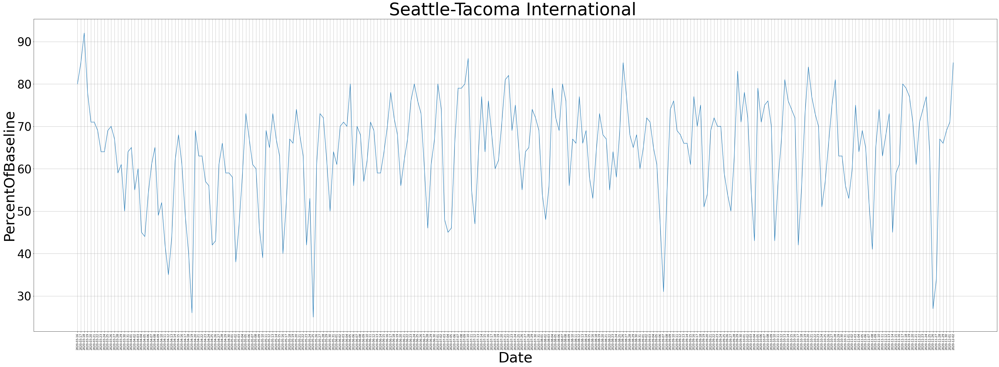

In [23]:
for i in df['AirportName'].unique():
    df_baseline = df[['PercentOfBaseline','Date']][df['AirportName']==i].sort_values('Date')
    
    fig = plt.figure(figsize=(60,20))

    sns.lineplot(data=df_baseline, x = "Date", y="PercentOfBaseline")

    plt.xticks(rotation=90)
    plt.ylabel("PercentOfBaseline",size=50)
    plt.xlabel("Date",size=50)
    plt.yticks(fontsize = 40)

    plt.title(i, size = 60)
    plt.grid()

plt.show()


### Country's Avg PercentOfBaseline per month

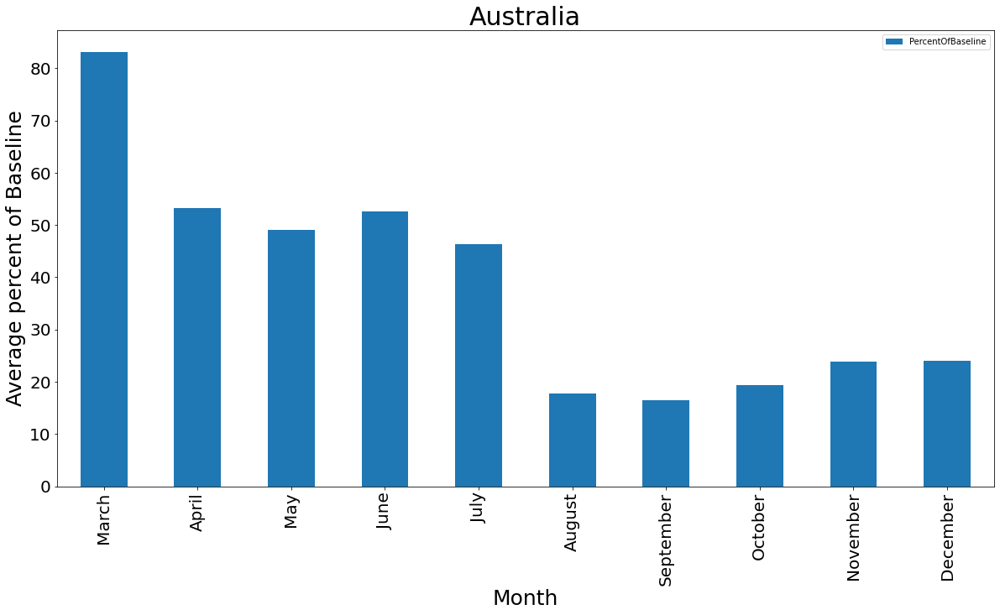

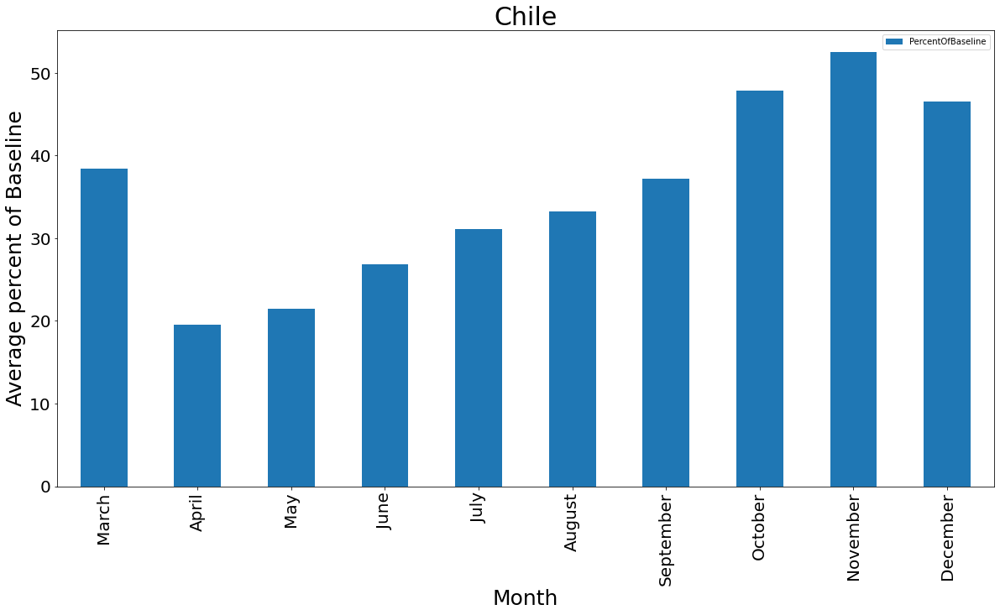

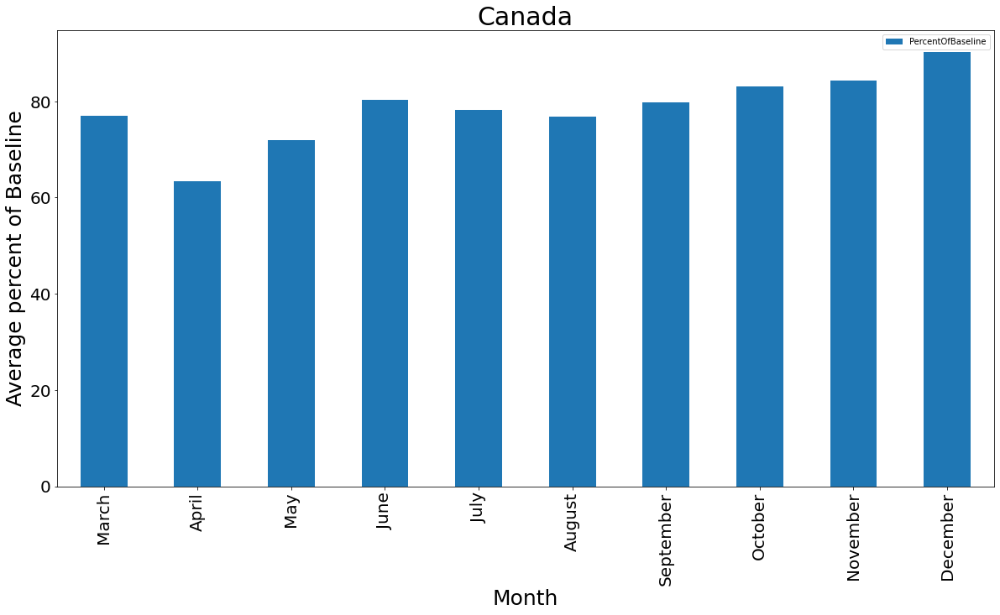

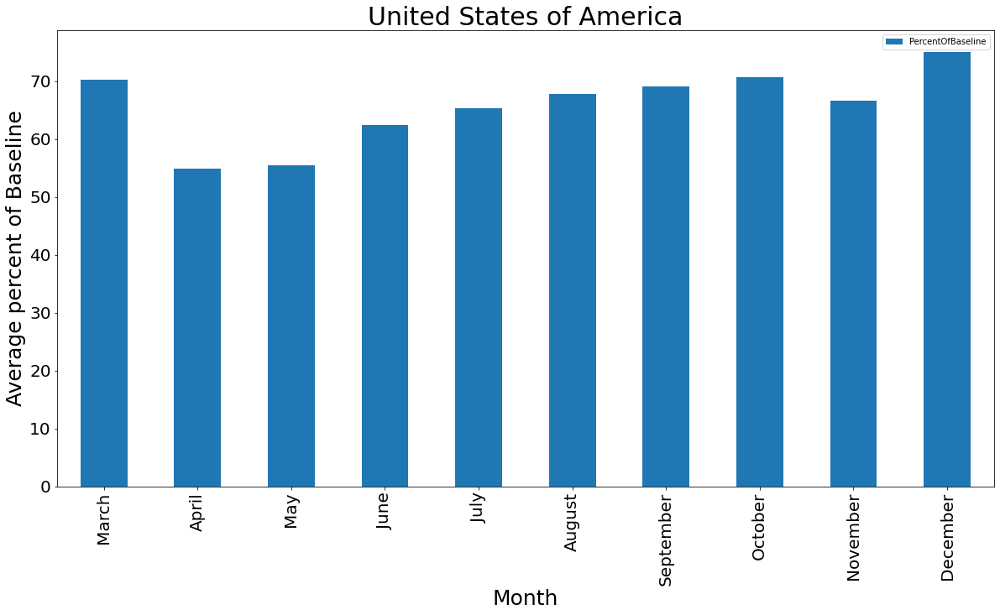

In [24]:
for i in df['Country'].unique():
    
    df_month = df[['PercentOfBaseline', 'Month']][df['Country']==i].sort_values('Month')
    
    df_month_avg = df_month.groupby('Month', as_index=False)['PercentOfBaseline'].mean()
    
    df_month_avg_sort = Sort_Dataframeby_Month(df=df_month_avg,monthcolumnname='Month')
    
    df_month_avg_sort.plot.bar(x='Month', y='PercentOfBaseline', figsize = (20,10))

    plt.ylabel("Average percent of Baseline",size=25)
    plt.xlabel("Month",size=25)
    plt.title(i, size = 30)
    plt.tick_params(labelsize=20)
    
plt.show()

### Airport's Avg PercentOfBaseline per month

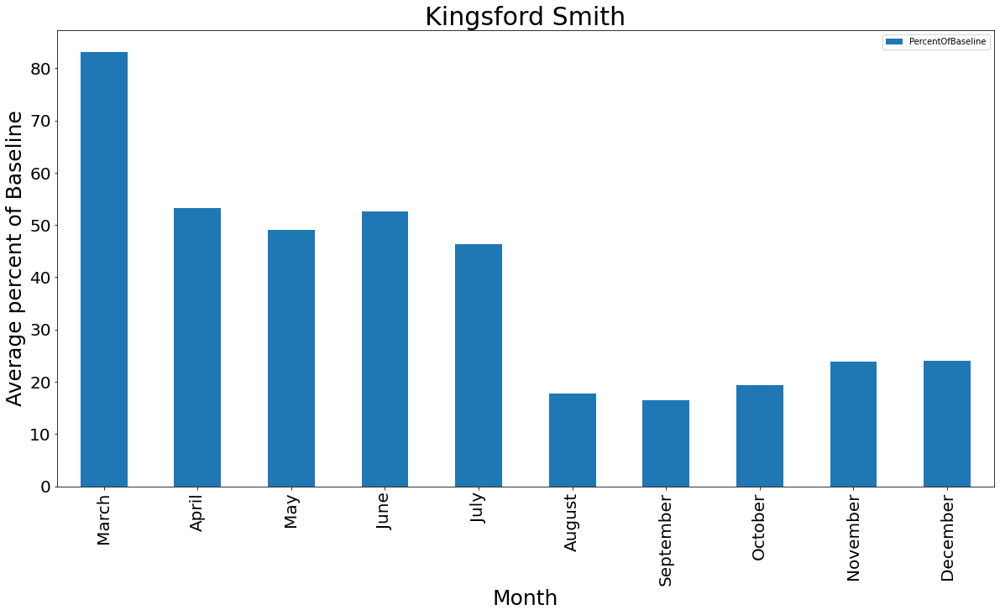

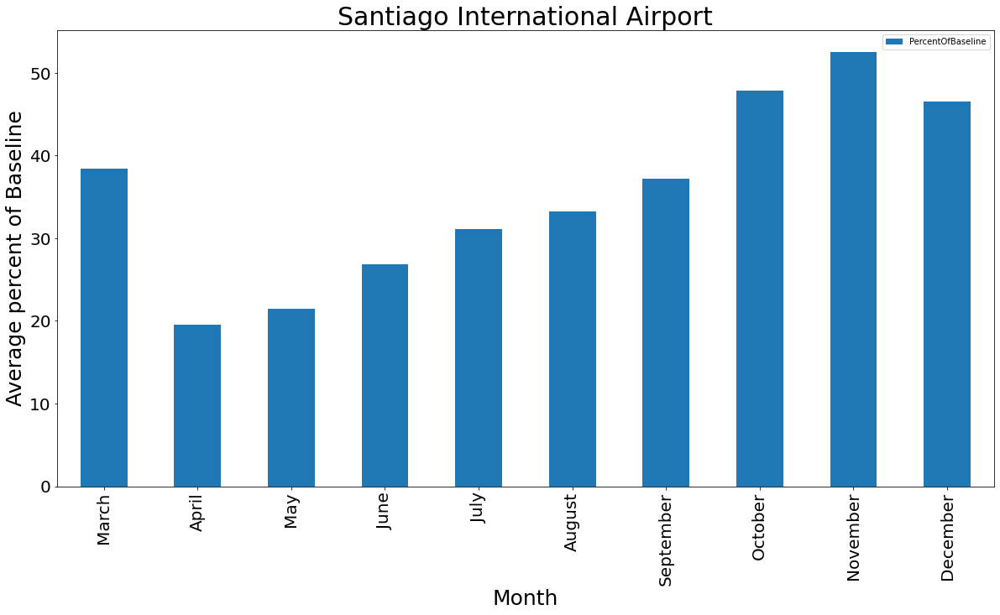

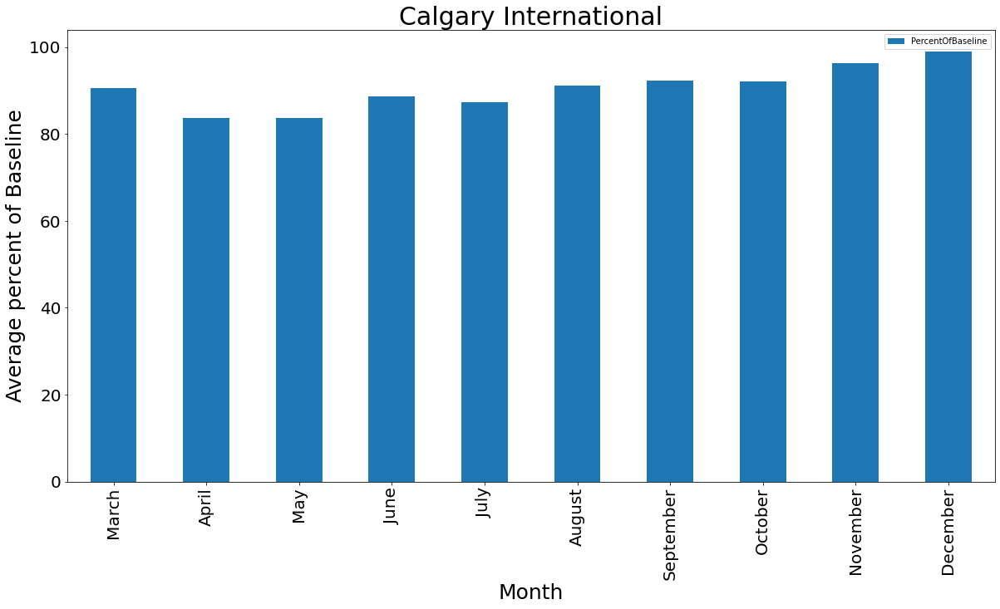

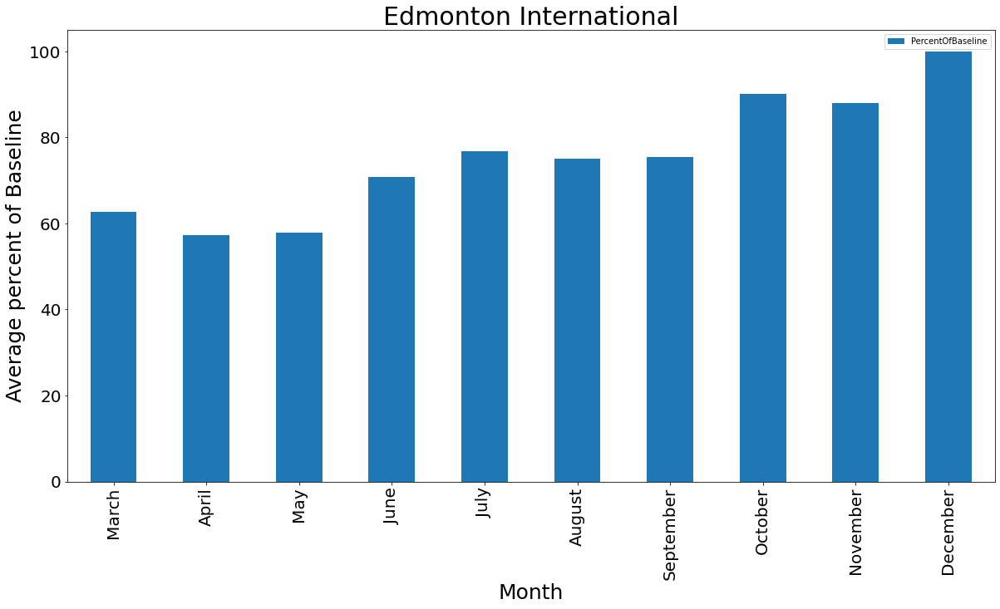

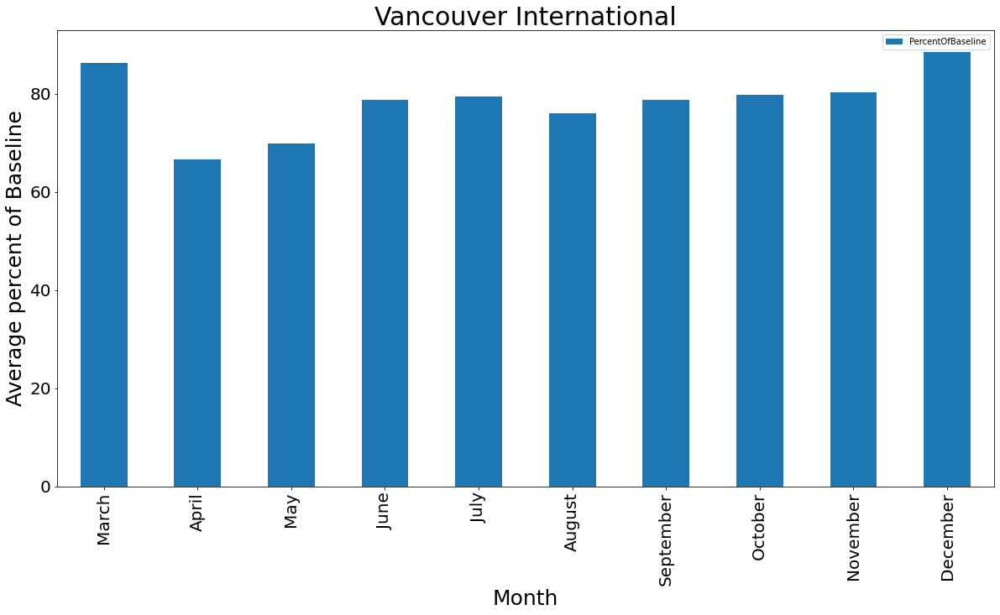

...

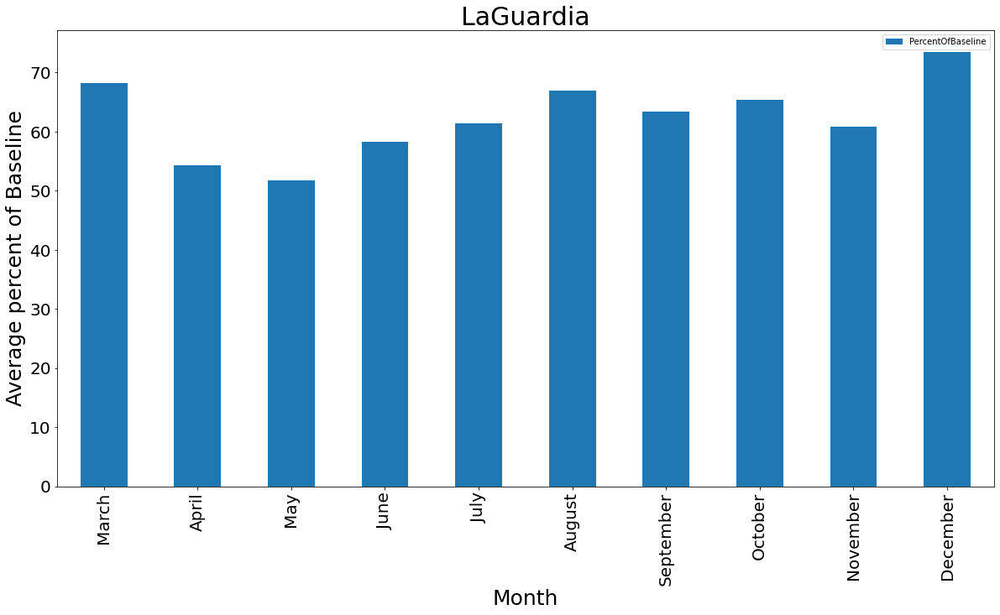

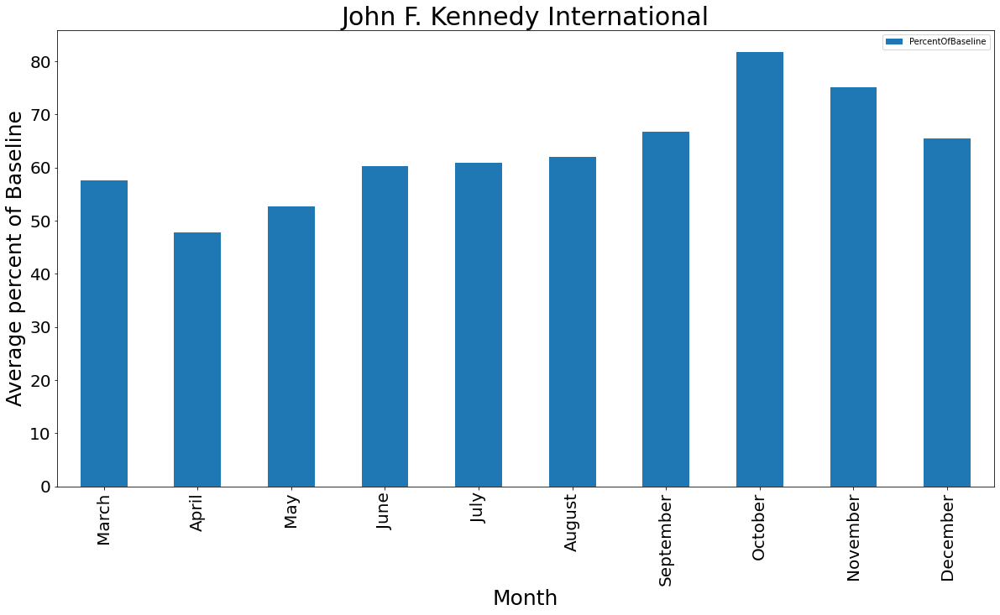

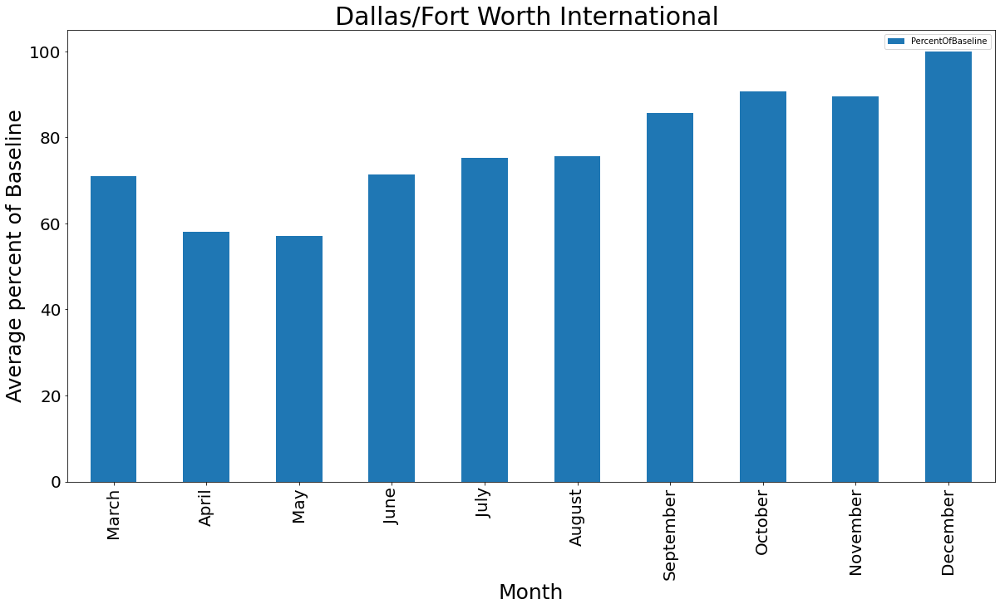

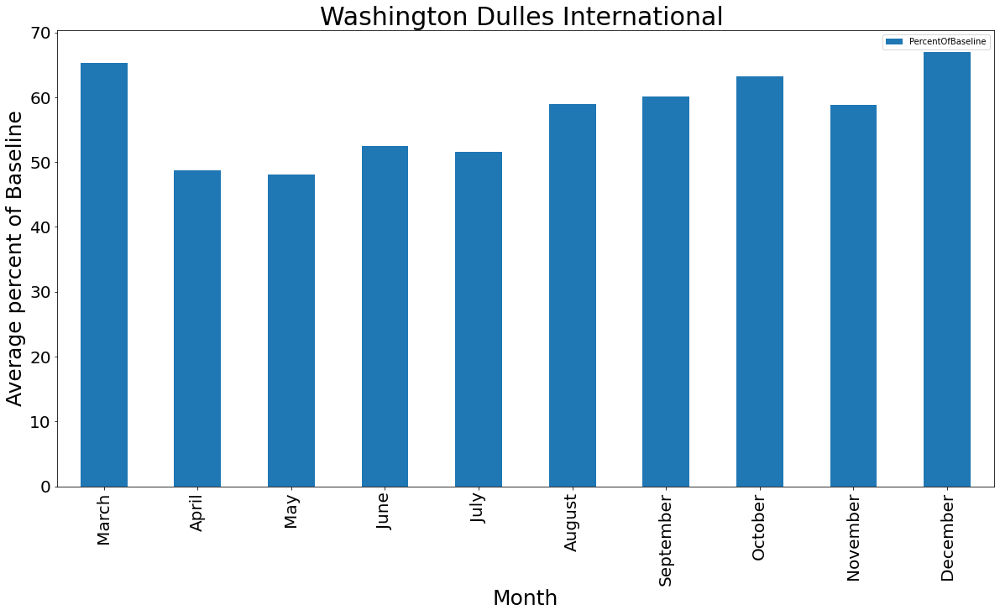

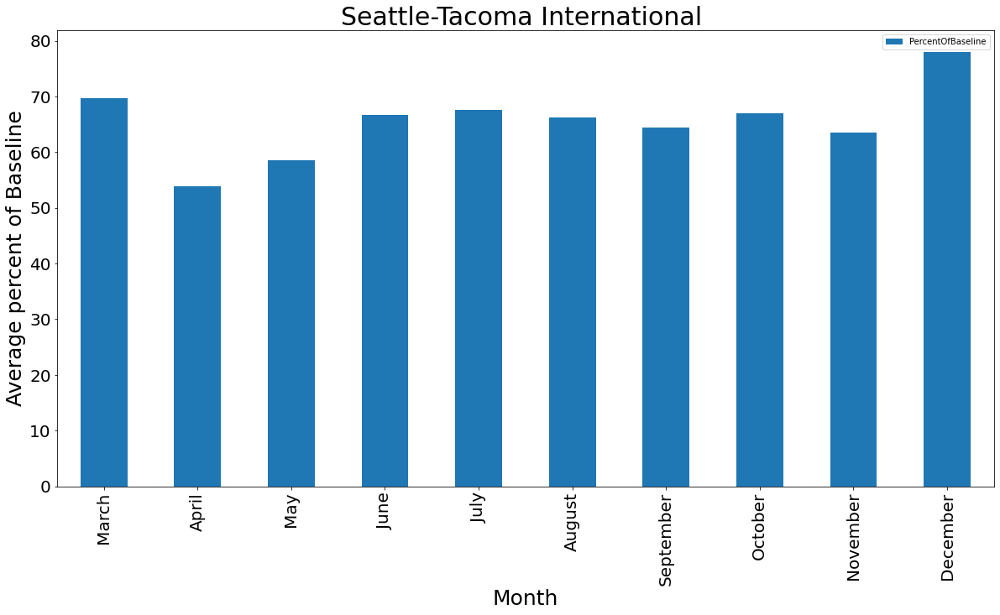

In [25]:

for i in df['AirportName'].unique():
    
    df_month = df[['PercentOfBaseline', 'Month']][df['AirportName']==i].sort_values('Month')
    df_month_avg = df_month.groupby('Month', as_index=False)['PercentOfBaseline'].mean()  
    df_month_avg_sort = Sort_Dataframeby_Month(df=df_month_avg,monthcolumnname='Month')
    
    df_month_avg_sort.plot.bar(x='Month', y='PercentOfBaseline', figsize = (20,10))

    plt.ylabel("Average percent of Baseline",size=25)
    plt.xlabel("Month",size=25)
    plt.title(i, size = 30)
    plt.tick_params(labelsize=20)
    
plt.show()

